### SVC + RFECV to estimate the features that separate each cluster versus the rest. 

Once we know the clusters, we can try to come up with the subset of features that maximally separates one cluster versus the rest. In order to do this, we employed a support vector machine and recursively eliminated the features until finding the subset giving the maximum balanced score in 5-Fold cross-validation. Since each case is not totally independent to each other, there will be shared important features. We are more interested then in the unique features.

In [1]:
%matplotlib inline  

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from nilearn import image, plotting

In [3]:
# Load  scikit-learn stuff
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.utils import class_weight
from sklearn.metrics import confusion_matrix, balanced_accuracy_score, cohen_kappa_score, classification_report
from sklearn.feature_selection import RFECV
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.svm import LinearSVC

In [4]:
from scipy.spatial.distance import squareform
from copy import deepcopy
from joblib import Parallel, delayed
from sklearn.feature_selection import RFE
from sklearn.model_selection import check_cv 
from sklearn.base import is_classifier

SOME CLASS AND FUNCTION DEFNITIONS 

In [5]:
class PipelineRFE(Pipeline):

    def fit(self, X, y=None, **fit_params):
        super(PipelineRFE, self).fit(X, y, **fit_params)
        self.coef_ = self.steps[-1][-1].coef_
        return self

In [6]:
class myRFE(RFE):
    
    def __init__(self, estimator, cv=None, n_jobs=None):
        
        self.estimator = estimator
        self.cv = cv
        self.n_jobs = n_jobs
        
    
    def _scores_cv(self, X_train, y_train, X_val, y_val):
        n_features = X_train.shape[1]
        support_ = np.ones(n_features, dtype=np.bool)
        
        scores = []
        
        estimator = deepcopy(self.estimator)
         # Elimination
        while np.sum(support_) > 0:

            # Remaining features
            features = np.arange(n_features)[support_]
            
            # Fit with these features
            estimator.fit(X_train[:, features], y_train)
            # score on validation
            
            bac = balanced_accuracy_score(y_val, 
                                          estimator.predict(X_val[:, features]))
            scores.append(bac)

            # Compute absolute of coefficients
            coefs = np.abs(estimator.coef_)
            if coefs.ndim > 1:
                ranks = np.argsort(coefs.sum(axis=0))
            else:
                ranks = np.argsort(coefs)
    
            # remove feature with smallest weight
            feat_to_elim = features[ranks[0]]
            
            support_[feat_to_elim] = False
            
            
        return scores


    def fit(self, X, y, groups=None):
        
        if self.n_jobs is not None:
            parallel, func = list, self._scores_cv
        else:
            parallel = Parallel(n_jobs=self.n_jobs)
            func = delayed(self._scores_cv)
            
        cv = check_cv(self.cv, y, is_classifier(self.estimator))
        
        cv_scores = parallel(
            func(X[train_index], 
                 y[train_index], 
                 X[val_index], 
                 y[val_index]) \
            for train_index, val_index in cv.split(X, y)
        )
        
        self.cv_scores_ = np.array(cv_scores)[:,::-1] #np.array(cv_scores)[:,::-1]
        
        # Compute means
        #scores_means = np.mean(cv_scores, axis=0)[::-1]
        #scores_std = np.std(cv_scores, axis=0)[::-1]
        
        #scores_rev = scores_means 
        
        #argmax_idx = len(scores) - np.argmax(scores_rev) - 1
        #n_features_to_select = n_features - argmax_idx
        
        #rfe = RFE(self.estimator, 
         #         n_features_to_select = n_features_to_select)
        
        #rfe.fit(X, y)
        #
        # Set final attributes
        #self.support_ = rfe.support_
        #self.n_features_ = rfe.n_features_
        #self.ranking_ = rfe.ranking_
        #self.estimator_ = deepcopy(self.estimator)
        #self.estimator_.fit(self.transform(X), y)
        
        #Apply sem criterion
        #scores_rev_sem = scores_means[np.argmax(scores_rev)] - scores_std[np.argmax(scores_rev)]/np.sqrt(cv.get_n_splits(X, y))
        
        #Find first 
        #argmax_idx ? np.where(scores_means < scores_rev_sem)[::-1][0]
        
        #argmax_idx = len(scores) - np.argmax(scores_rev) - 1
        
        return self
        

        
    def predict_proba():
        return
    

    #def set_params(self, **parameters):
     #   for parameter, value in parameters.items():
      #      setattr(self, parameter, value)
       # return self


In [7]:
def get_weights_sel_features(rfecv_obj):
    """
    This function sets the weights for the
    selected features, making the rest zero
    
    """
    if isinstance(rfecv_obj, RFECV) is False:
        raise ValueError("not a RFECV object")
    
    weights = np.zeros(len(rfecv_obj.get_support()))
    weights[rfecv_obj.get_support()] = rfecv_obj.estimator_.named_steps['clf'].coef_.flatten()

    return weights

In [8]:
current_palette=sns.color_palette('colorblind')

# Load data

In [9]:
demo_w_clusters = pd.read_excel('../data/pheno_w_clusters.xlsx')
Y_combat = np.load('../data/data_after_combat.npz')['Y_combat']

In [10]:
RANDOM_STATE = 0

In [11]:
X = Y_combat[(demo_w_clusters.clus_id<4),:]
y = demo_w_clusters.loc[(demo_w_clusters.clus_id<4), 'clus_id'].astype(int).values

XX = X[y>0]
yy = y[y>0]

# Make sure classes start from 0
yy = LabelEncoder().fit_transform(yy)
XX, yy = shuffle(XX, yy, random_state=RANDOM_STATE)

Uncoment the line below to load previously computed results

In [9]:
from joblib import dump, load
rfe_list = load('../data/rfe_cluster_list.joblib')

In [371]:
pip_rfe = PipelineRFE([('ss', StandardScaler()), 
                       ('clf', LinearSVC(class_weight='balanced', 
                                         max_iter=1e5, 
                                         random_state=RANDOM_STATE))])
rfecv = RFECV(pip_rfe, scoring='balanced_accuracy', cv=5, n_jobs=5)

In [372]:
ovr_rfe = OneVsRestClassifier(rfecv)

In [ ]:
ovr_rfe.fit(XX, yy)

In [12]:
weights_ovr = np.array([get_weights_sel_features(ovr_rfe.estimators_[ii]) for ii in range(3)])

NameError: name 'ovr_rfe' is not defined

The first thing that we are going to try is to plot the strength from the weights of the selected features.
Plot sum of coefficients for each class and show the first 10

The problem is that these comparisons between groups are not independent. For example, comparing 1 versus rest and 3 versus rest are not independent because in both 

And now we can look at the same thing as above, the strength of each of these sub-networks

We can also try to plot this link-wise, filtering the biggest 1% of the weights

In [13]:
atlas_sn = image.load_img('../data/Desikan_ASD_javi.nii.gz')
atlas_sn = image.index_img(atlas_sn, 0)

In [15]:
atlas_coord = plotting.find_parcellation_cut_coords(atlas_sn)

Or my favourite way, plotting separately the positive and negative weights

In [37]:
import sys
import os
import json
from mne.viz import circular_layout

sys.path.append("../code")
from plot_connectivity_circle import plot_connectivity_circle

In [38]:
with open(os.path.join('../data', "sn_map_fs.json")) as json_file:
    sn_fs = json.load(json_file)
    
with open(os.path.join('../data',"sn_out_fs.json")) as json_file:
    sn_out_fs = json.load(json_file)

In [42]:
list(sn_out_fs.keys())

['middletemporal_rh',
 'caudalmiddlefrontal_lh',
 'inferiortemporal_rh',
 'Pallidum_rh',
 'rostralmiddlefrontal_lh',
 'frontalpole_lh',
 'cuneus_lh',
 'Caudate_rh',
 'lingual_rh',
 'rostralmiddlefrontal_rh',
 'transversetemporal_lh',
 'precentral_rh',
 'parstriangularis_rh',
 'VentralDC_rh',
 'entorhinal_lh',
 'Thalamus-Proper_rh',
 'bankssts_lh',
 'parsopercularis_rh',
 'caudalanteriorcingulate_rh',
 'Accumbens_lh',
 'pericalcarine_lh',
 'postcentral_lh',
 'precentral_lh',
 'middletemporal_lh',
 'Putamen_rh',
 'Putamen_lh',
 'paracentral_lh',
 'parstriangularis_lh',
 'parsorbitalis_lh',
 'VentralDC_lh',
 'Thalamus-Proper_lh',
 'superiorparietal_lh',
 'Caudate_lh',
 'precuneus_lh',
 'lateralorbitofrontal_lh',
 'cuneus_rh',
 'paracentral_rh',
 'transversetemporal_rh',
 'lateralorbitofrontal_rh',
 'frontalpole_rh',
 'Pallidum_lh',
 'parahippocampal_rh',
 'inferiortemporal_lh',
 'lingual_lh',
 'caudalmiddlefrontal_rh',
 'supramarginal_rh',
 'Hippocampus_lh',
 'bankssts_rh',
 'parsorbitali

In [33]:
labels = []
for key in sn_fs.keys():
    labels.append(key)
for key in sn_out_fs.keys():
    labels.append(key)

In [34]:
lh_labels = [name for name in labels if name.endswith('lh')]
rh_labels = [name for name in labels if name.endswith('rh')]
lh_idxs = [ii for ii, name in enumerate(labels) if name.endswith('lh')]
rh_idxs = [ii for ii, name in enumerate(labels) if name.endswith('rh')]

In [35]:
social_lh_label = lh_labels[:13]
social_lh_label.sort()

out_lh_labels = lh_labels[13:]
out_lh_labels.sort()               

social_rh_labels = rh_labels[:13]
social_rh_labels.sort()

out_rh_labels = rh_labels[13:]
out_rh_labels.sort()

In [36]:
idxs_dict = dict()

for ii, label in enumerate(labels):
    idxs_dict[label] = ii

In [37]:
labels_ordered = social_lh_label + out_lh_labels + out_rh_labels[::-1] + social_rh_labels[::-1]

In [38]:
order_idxs = np.array([idxs_dict[label] for label in labels_ordered])

In [39]:
# Save the plot order
node_order = labels_ordered #lh_labels[::-1] + rh_labels
node_angles = circular_layout(labels_ordered, node_order, start_pos=90,
                              group_boundaries=[0, len(labels) // 2])

In [40]:
#construct names dropping the hemisphere at the end and empty intermediate names
name_nodes = [name.split("_")[0] for name in labels_ordered]
#name_nodes[:43] = [name.upper() if ii % 2 ==0 else '' for (ii, name) in enumerate(name_nodes[:43])]
#name_nodes[43:] = [name.upper() if ii % 2 !=0 else '' for (ii, name) in enumerate(name_nodes[43:])]

In [41]:
colours_hemi = ['darkolivegreen' for ii in range(13)] + ['coral' for ii in range(13, 43)]
node_colours = colours_hemi + colours_hemi[::-1]

In [486]:
# One checking...
# The weight in rfe_cv correspond to the weight of the selected fetures
pip_rfe.fit(XX[:,ovr_rfe.estimators_[0].get_support()], (yy==0).astype(int))
np.corrcoef(pip_rfe.coef_, 
            ovr_rfe.estimators_[0].estimator_.named_steps['clf'].coef_)

array([[1., 1.],
       [1., 1.]])

plot this onto the brain?

In [ ]:
from matplotlib import colors

In [1084]:
from sklearn.feature_selection import RFE
from sklearn.model_selection import GridSearchCV

In [563]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)
pip_rfe = PipelineRFE([('ss', StandardScaler()), 
                       ('clf', LinearSVC(class_weight='balanced', 
                                         max_iter=1e5, 
                                         random_state=RANDOM_STATE))])

Let's use the one standard rule to select the number of features. In order to do that, we need the cross-validation standard deviation from subset of features, but unforntunately, this info is not provided by RFECV. Let's try to get to something similar using selectFromModel

In [564]:
my_rfe = myRFE(estimator=pip_rfe, cv=cv, n_jobs=5)

In [565]:
my_ovo_rfe = OneVsRestClassifier(my_rfe)
#my_ovo_rfe.fit(XX, yy)

NameError: name 'OneVsRestClassifier' is not defined

In [2037]:
import pickle
from joblib import dump, load
#dump(my_ovo_rfe, '../data/rfe_models.joblib') 


In [18]:
rfe_list[0].

RFE(estimator=PipelineRFE(memory=None,
                          steps=[('ss',
                                  StandardScaler(copy=True, with_mean=True,
                                                 with_std=True)),
                                 ('clf',
                                  LinearSVC(C=1.0, class_weight='balanced',
                                            dual=True, fit_intercept=True,
                                            intercept_scaling=1,
                                            loss='squared_hinge',
                                            max_iter=100000.0,
                                            multi_class='ovr', penalty='l2',
                                            random_state=0, tol=0.0001,
                                            verbose=0))],
                          verbose=False),
    n_features_to_select=56, step=1, verbose=0)

In [24]:
current_palette=sns.color_palette('colorblind')
c_1 = current_palette[4]
c_2 = current_palette[1]
c_3 = current_palette[2]

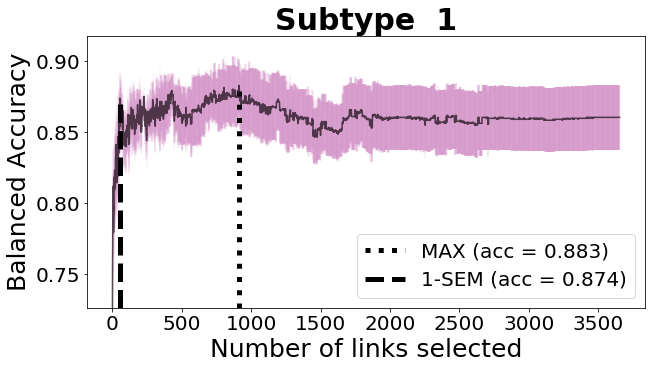

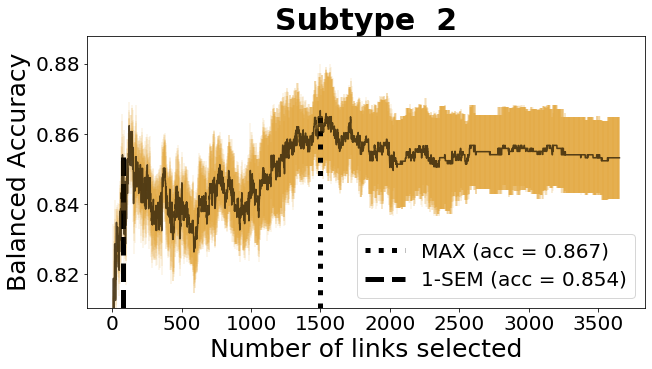

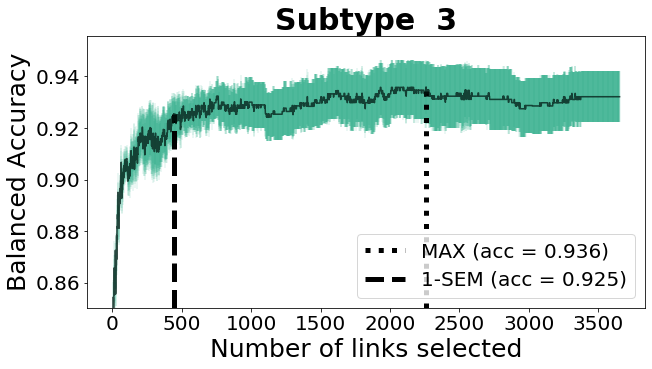

In [36]:
cluster_colors = [c_1, c_2, c_3]

for ii in range(3):
    fig, ax = plt.subplots(figsize=(10, 5))
    
    cv_scores_ = load('../data/one_vs_rest_scores_%d.joblib'% (ii+1))
    
    cv_means = cv_scores_.mean(axis=0)
    cv_std = cv_scores_.std(axis=0)
    

    ax.plot(np.arange(3655), cv_means, color= 'black', alpha=0.7)
    ax.errorbar(x = np.arange(3655), 
                     y=cv_means, yerr=cv_std/np.sqrt(5), alpha=0.1, color= cluster_colors[ii])
    ymin, ymax = ax.get_ylim()
    
    max_id = np.argmax(cv_means)
    ax.vlines(x=0.1 + max_id + 1, ymin=ymin+0.1, ymax=cv_means[max_id], 
                   label='MAX (acc = %.3f)' % max(cv_means), linestyles='dotted', linewidth=5)
    #axs[ii].text(max_id + 1, y=ymin+0.12, s='max', size=15, weight='bold')
    
    #Take the first element for which the cross-validation scores are within the 1-SEM rule
    one_sem_thr = cv_means[max_id] - cv_std[max_id]/np.sqrt(5)
    one_sem_id = np.where(cv_means >= one_sem_thr)[0][0]
    
    ax.vlines(x=0.1 + one_sem_id + 1, ymin =ymin + 0.1,  ymax=cv_means[one_sem_id], 
                   label='1-SEM (acc = %.3f)' % cv_means[one_sem_id],  
              linestyles='dashed', linewidth=5)
    #axs[ii].text(x=one_sem_id + 11, y =ymin + 0.1, s='1-SEM ', size=15, weight='bold')
    ax.set_ylim([ymin + 0.1, ymax])
    ax.legend(loc='lower right', prop={'size':20})
    ax.set_title("Subtype % d" % (ii+1), size=30, weight='bold')
    ax.tick_params(labelsize=20)
    ax.set_ylabel("Balanced Accuracy", size=25)
    ax.set_xlabel("Number of links selected", size=25)
    
    plt.savefig("../plots/rfe_cluster_%d.png" % (ii +1), dpi=300)
    plt.savefig("../plots/rfe_cluster_%d.svg" % (ii +1), dpi=300)

In [21]:
load('../data/one_vs_rest_scores_1.joblib')

(5, 3655)

In [671]:
for ii in range(3):
    cv_means = my_ovo_rfe.estimators_[ii].cv_scores_
    dump(my_ovo_rfe.estimators_[ii].cv_scores_, '../data/one_vs_rest_scores_%d.joblib'% (ii + 1) )

In [652]:
for ii in range(3):
    cv_means = my_ovo_rfe.estimators_[ii].cv_scores_.mean(axis=0)
    cv_std = my_ovo_rfe.estimators_[ii].cv_scores_.std(axis=0)
    max_id = np.argmax(cv_means)
    print("cluster %d" % (ii +1))
    print("maximum score=%.4f, features selected = %d" % (cv_means[max_id], 1 + max_id))
    
    
    #print(cv_means[max_id], " ", (cv_means[max_id] - cv_std[max_id]/np.sqrt(5)))
    one_sem_thr = cv_means[max_id] - cv_std[max_id]/np.sqrt(5)
    one_sem_id = np.where(cv_means >= one_sem_thr)[0][0]
    
    print("1-sem minimum = %.4f, selected score = %.4f and features = %d" %(one_sem_thr,
                                                                          cv_means[one_sem_id],
                                                                          one_sem_id + 1)
         )
    print(" ")
    #print(one_sem_id, " ", cv_means[one_sem_id]  )

cluster 1
maximum score=0.8829, features selected = 913
1-sem minimum = 0.8643, selected score = 0.8739 and features = 56
 
cluster 2
maximum score=0.8667, features selected = 1500
1-sem minimum = 0.8535, selected score = 0.8541 and features = 75
 
cluster 3
maximum score=0.9359, features selected = 2261
1-sem minimum = 0.9255, selected score = 0.9255 and features = 444
 


In [1542]:
# fit RFE for each case 
rfe_list = []
for ii in range(3):
    cv_means = my_ovo_rfe.estimators_[ii].cv_scores_.mean(axis=0)
    cv_std = my_ovo_rfe.estimators_[ii].cv_scores_.std(axis=0)
    max_id = np.argmax(cv_means)
    
    n_features_to_select = np.where(cv_means >= (cv_means[max_id] - cv_std[max_id]/np.sqrt(5)))[0][0] + 1
    print("cluster %d, number of features to select %d" % (ii, n_features_to_select))
    rfe = RFE(pip_rfe, n_features_to_select=n_features_to_select)
    
    rfe.fit(XX, (yy==ii).astype(int))
    
    rfe_list.append(deepcopy(rfe))

cluster 0, number of features to select 56
cluster 1, number of features to select 75
cluster 2, number of features to select 444


In [2069]:
#from joblib import dump, load
#dump(rfe_list, '../data/rfe_cluster_list.joblib') 

In [17]:
support_mat = np.array([estimator.get_support() for estimator in rfe_list])

In [18]:
# Unique features
unique_links = [support_mat[ii,:]*(np.sum(support_mat, axis=0) == 1) for ii in range(3)]

In [19]:
#Links compared by two groups
partial_share_links = []
for ii in range(3):
    for jj in range(ii+1, 3):
        partial_share_links.append(support_mat[ii,:]*support_mat[jj,:]*(np.sum(support_mat, axis=0) == 2))

In [20]:
# Links selected in the three groups
share_links = np.sum(support_mat, axis=0) == 3

In [21]:
print("There are %d links unique to cluster 1,"
     " %d links unique to cluster 2,"
     " and %d links unique to cluster 3" % (sum(unique_links[0]), 
                                            sum(unique_links[1]), 
                                            sum(unique_links[2]))
     )
print("------------------------------------"
      "------------------------------------"
     "------------------------------------")
print("There are %d shared links between cluster 1 and cluster 2,"
     " %d shared links between cluster 1 and cluster 3,"
     " and %d links between cluster 2 and cluster 3" % (sum(partial_share_links[0]), 
                                                        sum(partial_share_links[1]), 
                                                        sum(partial_share_links[2]))
     )
print("------------------------------------"
      "------------------------------------"
     "------------------------------------")
print("There are %d shared links by all three clusters" % sum(share_links))

There are 43 links unique to cluster 1, 54 links unique to cluster 2, and 412 links unique to cluster 3
------------------------------------------------------------------------------------------------------------
There are 1 shared links between cluster 1 and cluster 2, 12 shared links between cluster 1 and cluster 3, and 20 links between cluster 2 and cluster 3
------------------------------------------------------------------------------------------------------------
There are 0 shared links by all three clusters


In [23]:
def get_weights_sel_features(rfe_obj):
    """
    This function sets the weights for the
    selected features, making the rest zero
    
    """
    if isinstance(rfe_obj, RFE) is False:
        raise ValueError("not a RFECV object")
    
    weights = np.zeros(len(rfe_obj.get_support()))
    weights[rfe_obj.get_support()] = rfe_obj.estimator_.named_steps['clf'].coef_.flatten()

    return weights

In [24]:
weights_ovr = np.array([get_weights_sel_features(rfe_list[ii]) for ii in range(3)])

In [44]:
%matplotlib inline

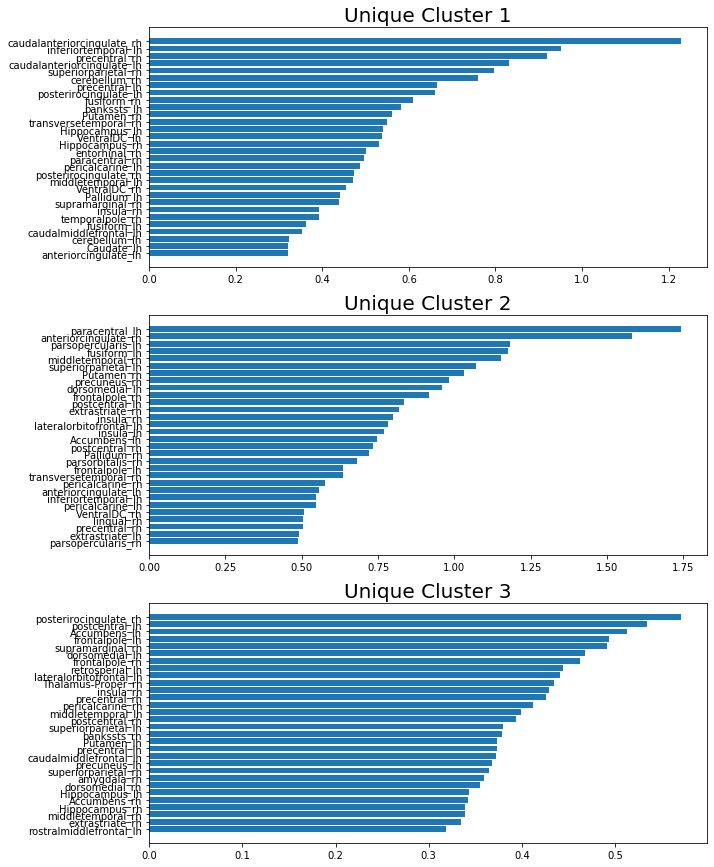

In [45]:
fig, axs = plt.subplots(nrows=3, figsize=(10,15))
for ii in range(3):
    s = np.abs(squareform(weights_ovr[ii,:]*unique_links[ii])).sum(axis=0)
    axs[ii].barh(np.array(labels)[np.argsort(s)][56:86:1], s[np.argsort(s)][56:86:1])
    axs[ii].set_title('Unique Cluster %d' % (ii+1), size=20)

In [46]:
# Merge hemispheres
parcels = np.unique([label.split("_")[0] for label in labels])


parcels_dict = {}
for parcel in parcels:
    parcels_dict[parcel] = np.concatenate([np.where(parcel + "_lh" == np.array(labels))[0], 
                                           np.where(parcel + "_rh" == np.array(labels))[0] ])

parcels[8] = 'rostral-ACC'
parcels[10] = 'caudal-ACC'
parcels_dict_2 = parcels_dict.copy()
parcels_dict_2['rostral-ACC'] = parcels_dict_2.pop('anteriorcingulate')
parcels_dict_2['caudal-ACC'] = parcels_dict_2.pop('caudalanteriorcingulate')

Create weight matrix for each case and in the merged hemisphere space

In [34]:
weights_parcels_dict = {}

for clus_id in range(3):

    w_new = np.zeros((43, 43))

    w_fs = abs(squareform(weights_ovr[clus_id, :]*unique_links[clus_id])).copy()

    for ii, name_ii in enumerate(parcels):
        for jj, name_jj in enumerate(parcels):
            w_new[ii, jj] = np.sum(w_fs[parcels_dict_2[name_ii],:][:, parcels_dict_2[name_jj]])
            
    w_new = pd.DataFrame(w_new)
    w_new.index = parcels
    w_new.columns = parcels
    
    weights_parcels_dict['clus_%d' % (clus_id+1)] = w_new

In [38]:
import networkx as nx

In [112]:
def plot_network(weights, idx, 
                 node_size = 500,
                 node_color = 'red',
                 edge_width= 1,
                 font_size=10,
                 figsize = plt.rcParams['figure.figsize'],
                 dpi=plt.rcParams['figure.dpi']):
    
    mask = np.zeros((43, 43))
    mask[idx,:] = 1
    mask[:,idx] = 1
    
    temp_net = weights*mask
    G = nx.from_pandas_adjacency(temp_net)

    node_labels = {}
    node_sizes = []
    for ii in range(43):

        if ii==idx:
            node_labels[temp_net.index[ii]]=temp_net.index[ii]
            node_sizes.append(node_size)
        else:
            if temp_net.iloc[idx,ii]>0:
                node_labels[temp_net.index[ii]]=temp_net.index[ii]
                node_sizes.append(node_size)
            else:
                node_labels[temp_net.index[ii]]=''
                node_sizes.append(node_size/100)

    pos = nx.circular_layout(G)
    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    edge_w = [x[2]['weight'] for x in G.edges(data=True)]
    edge_vmin = np.min(temp_net)
    edge_vmax = np.max(temp_net)

    # Custom the nodes:
    nx.draw_networkx_nodes(G,
            pos=pos, 
            with_labels=False, 
            alpha=0.2,
            node_color= node_color,
            node_size = node_sizes, ax=ax)
    
    nx.draw_networkx_edges(G,
            pos=pos, alpha=1,width=edge_width,
            edge_color = edge_w,
            edge_cmap = plt.cm.copper, ax=ax)
        
    nx.draw_networkx_labels(G, 
                            pos,
                            labels=node_labels,
                            font_weight='bold',
                           font_size=font_size, ax=ax)

    return fig, ax

In [64]:
%matplotlib inline

In [119]:
fig, ax = plot_network(weights_parcels_dict[clus_id], 
                               idx, 
                     node_color='black', 
                     node_size=1000,
                     edge_width=5,
                     font_size=10
                      figsize=(20, 10))
plt.axis('off')
plt.tight_layout()

SyntaxError: invalid syntax (<ipython-input-119-9a69ee50d7e7>, line 7)

In [86]:
ii=2
parcel_weights = np.array([squareform(weights_ovr[ii,:]*unique_links[ii])[:, idxs] \
                      for idxs in parcels_dict.values()])
s = np.abs(parcel_weights).sum(axis=1).sum(axis=1)


Compute connectivity weights in merging both hemispheres

In [91]:
weight_conn=np.zeros(shape=(3, len(parcels_dict.values()), len(parcels_dict.values())))
for clus_id in range(3):
    for ii, xidx in enumerate(parcels_dict.values()):
        for jj, yidx in enumerate(parcels_dict.values()):
            weight_conn[clus_id, ii, jj] = np.sum(squareform(abs(weights_ovr[clus_id,:]*unique_links[clus_id]))[xidx,:][:,yidx])

In [146]:
np.save('../data/weights_subtype_desikan.npy', weight_conn)

In [124]:
np.sum(weight_conn[0, :,:],axis=1)/max(np.sum(weight_conn[0, :,:],axis=1))

array([0.1118753 , 0.24404432, 0.52036799, 0.3551075 , 0.27224679,
       0.        , 0.48165812, 0.16952388, 0.15532654, 0.37236809,
       1.        , 0.17163175, 0.52623894, 0.        , 0.        ,
       0.33908202, 0.        , 0.0854842 , 0.47187766, 0.55275546,
       0.19000997, 0.1000571 , 0.14883651, 0.37159813, 0.37905805,
       0.14387049, 0.09320589, 0.        , 0.09939733, 0.23676925,
       0.08967852, 0.55111811, 0.76935419, 0.083     , 0.08585527,
       0.        , 0.38688591, 0.        , 0.30016987, 0.32095204,
       0.08089213, 0.26652312, 0.        ])

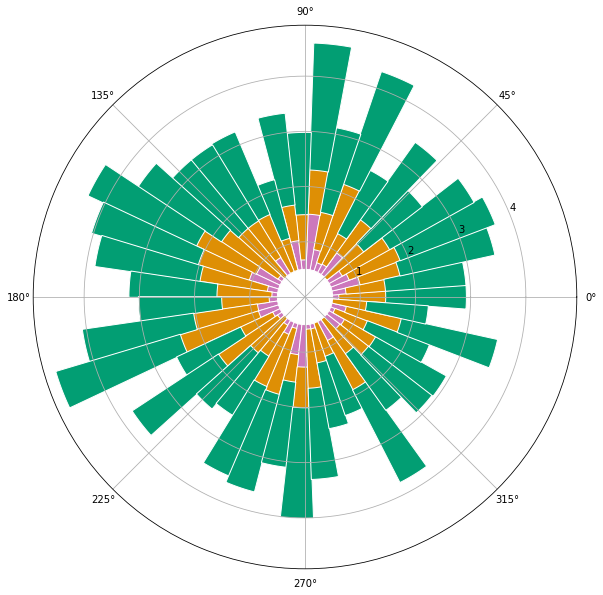

In [175]:
# Values of each group
plt.figure(figsize=(20,10))
ax=plt.subplot(polar=True)
bars1 = 0.5 + np.sum(weight_conn[0, :,:],axis=1)/max(np.sum(weight_conn[0, :,:],axis=1))
bars2 = 0.5 + np.sum(weight_conn[1, :,:],axis=1)/max(np.sum(weight_conn[1, :,:],axis=1))
bars3 = 0.5 + np.sum(weight_conn[2, :,:],axis=1)/max(np.sum(weight_conn[2, :,:],axis=1))
 
# Heights of bars1 + bars2
bars12 = np.add(bars1, bars2).tolist()
bars123 = np.add(bars1, bars2, bars3).tolist()
 
# The position of the bars on the x-axis
r = theta

 
# Names of group and bar width
names = list(parcels_dict.keys())
barWidth = 1
 
# Create brown bars
ax.bar(r, bars1, color=current_palette[4], edgecolor='white', width=0.15, bottom=0.5)
# Create green bars (middle), on top of the firs ones
ax.bar(r, bars12, color=current_palette[1], edgecolor='white', width=0.15, bottom=bars1)
# Create green bars (top)
ax.bar(r, bars123, color=current_palette[2], edgecolor='white', width=0.15, bottom=bars12)
 
# Custom X axis
#plt.xticks(r, names, fontweight='bold', rotation=90)
#plt.xlabel("group")
pass

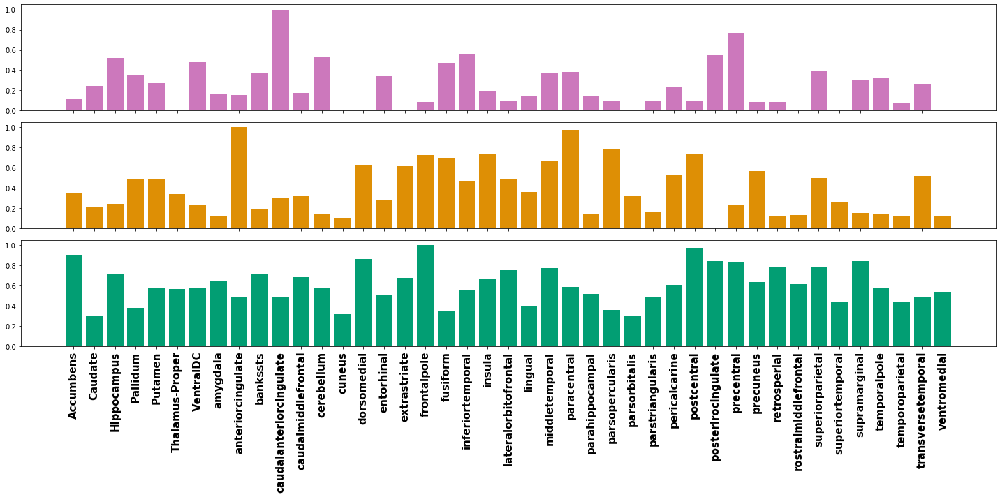

In [198]:
fig, axs = plt.subplots(nrows=3, sharex=True, figsize=(20,10))
axs[0].bar(x=np.arange(43), 
           height=np.sum(weight_conn[0, :,:],axis=1)/max(np.sum(weight_conn[0, :,:],axis=1)), 
           color=current_palette[4])
axs[1].bar(x=np.arange(43), 
           height=np.sum(weight_conn[1, :,:],axis=1)/max(np.sum(weight_conn[1, :,:],axis=1)),
          color=current_palette[1])
axs[2].bar(x=np.arange(43), 
           height=np.sum(weight_conn[2, :,:],axis=1)/max(np.sum(weight_conn[2, :,:],axis=1)),
          color=current_palette[2])
axs[2].set_xticks(np.arange(43))
axs[2].set_xticklabels(list(parcels_dict.keys()), rotation=90, size=15, weight='bold')
plt.tight_layout()
pass

In [190]:
plt.barh?

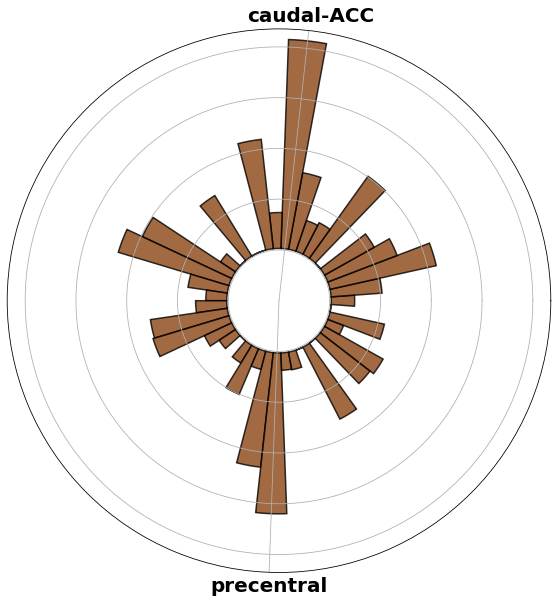

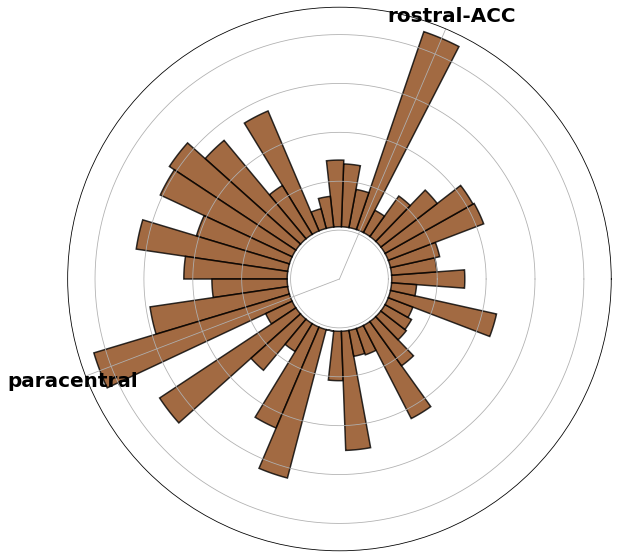

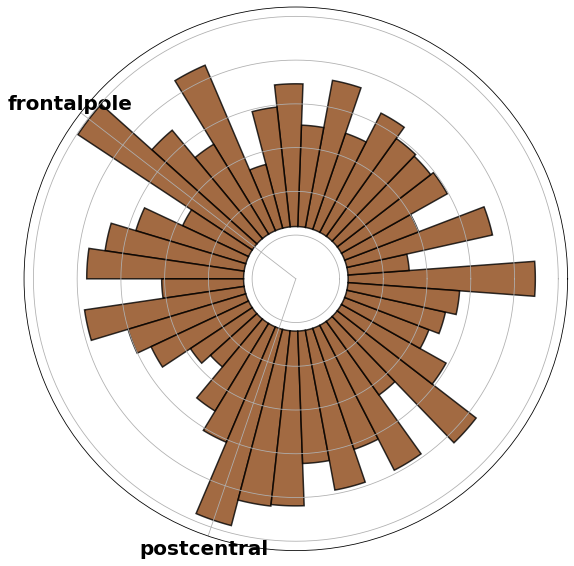

In [100]:
fig=plt.figure(figsize=(20,10))
    ax = plt.subplot(polar=True)
for ii in range(3):
    parcel_weights = np.array([squareform(weights_ovr[ii,:]*unique_links[ii])[:, idxs] \
                      for idxs in parcels_dict.values()])
    s = np.abs(parcel_weights).sum(axis=1).sum(axis=1)

    
    bars = ax.bar(theta, s, 
                  width=width, 
                  edgecolor='black', 
                  linewidth=1.5, bottom=max(s)/4, color='black')


    for r, bar in zip(theta, bars):
        bar.set_facecolor("saddlebrown")#,plt.cm.pink_r(bar.get_height()/max(s)))
        bar.set_alpha(0.8)

    ax.set_xticks(theta[np.argsort(s)[::-1][:2]])        
    ax.set_xticklabels(parcels[np.argsort(s)[::-1][:2]], weight='bold', size=20)        
    ax.set_yticklabels([])
    

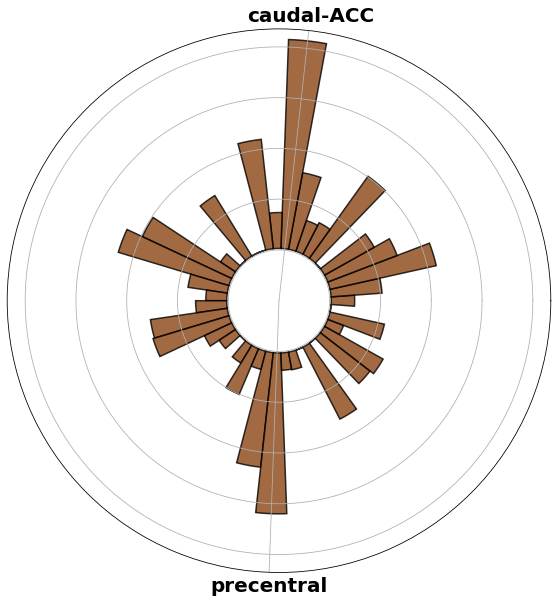

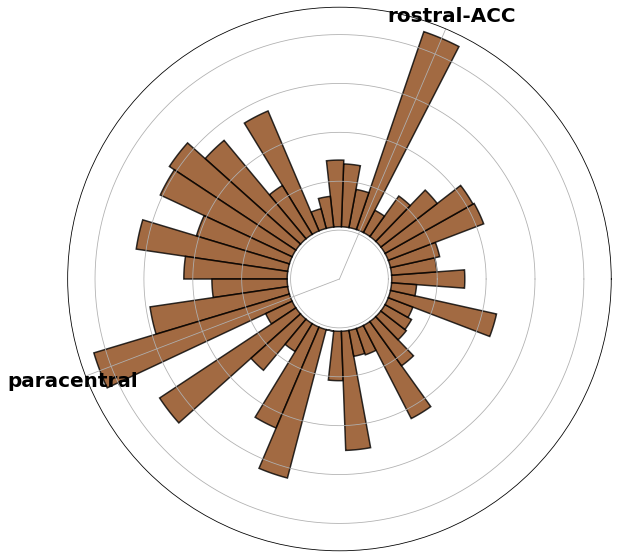

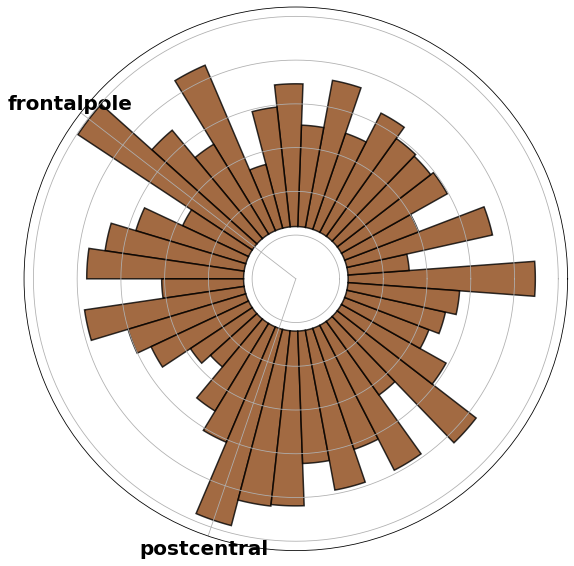

In [107]:
for ii in range(3):
    parcel_weights = np.array([squareform(weights_ovr[ii,:]*unique_links[ii])[:, idxs] \
                      for idxs in parcels_dict.values()])
    s = np.abs(parcel_weights).sum(axis=1).sum(axis=1)

    fig=plt.figure(figsize=(20,10))
    ax = plt.subplot(polar=True)
    bars = ax.bar(theta, s, 
                  width=width, 
                  edgecolor='black', 
                  linewidth=1.5, bottom=max(s)/4, color='black')


    for r, bar in zip(theta, bars):
        bar.set_facecolor("saddlebrown")#,plt.cm.pink_r(bar.get_height()/max(s)))
        bar.set_alpha(0.8)

    ax.set_xticks(theta[np.argsort(s)[::-1][:2]])        
    ax.set_xticklabels(parcels[np.argsort(s)[::-1][:2]], weight='bold', size=20)        
    ax.set_yticklabels([])
    
    fig.savefig('../plots/panel_f_strength_clus_%d.png' % (ii +1), dpi=600)
    fig.savefig('../plots/panel_f_strength_clus_%d.svg' % (ii +1), dpi=600)

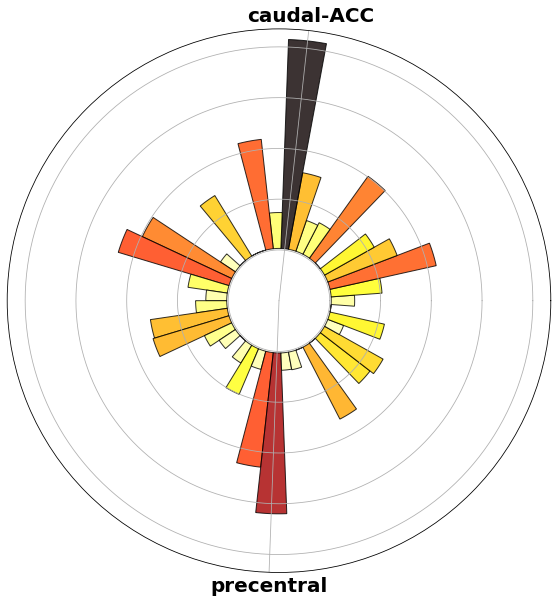

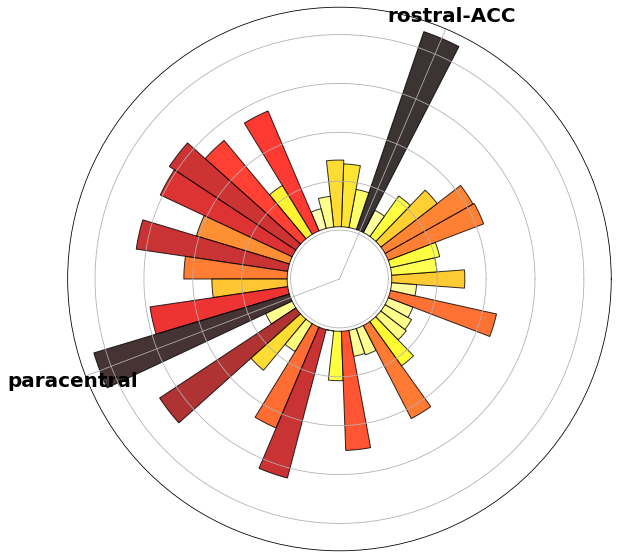

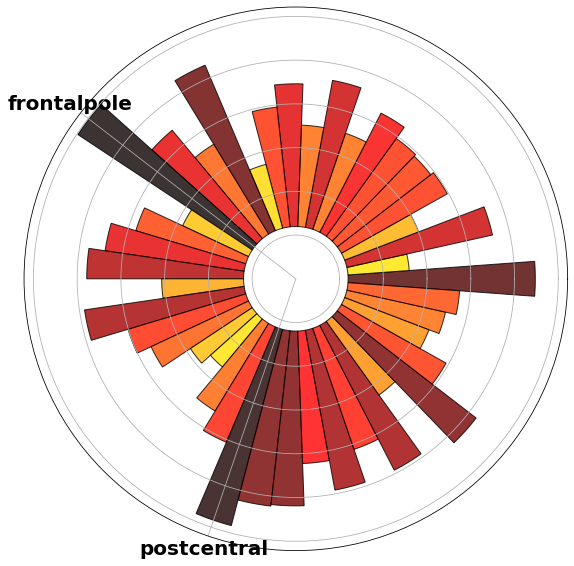

In [720]:
for ii in range(3):
    parcel_weights = np.array([squareform(weights_ovr[ii,:]*unique_links[ii])[:, idxs] \
                      for idxs in parcels_dict.values()])
    s = np.abs(parcel_weights).sum(axis=1).sum(axis=1)

    fig=plt.figure(figsize=(20,10))
    ax = plt.subplot(polar=True)
    bars = ax.bar(theta, s, 
                  width=width, 
                  edgecolor='black', 
                  linewidth=1, bottom=max(s)/4)


    for r, bar in zip(theta, bars):
        bar.set_facecolor(plt.cm.hot_r(bar.get_height()/max(s)))
        bar.set_alpha(0.8)

    ax.set_xticks(theta[np.argsort(s)[::-1][:2]])        
    ax.set_xticklabels(parcels[np.argsort(s)[::-1][:2]], weight='bold', size=20)        
    ax.set_yticklabels([])
    fig.savefig('../plots/panel_f_strength_clus_%d.png' % (ii +1), dpi=600)
    fig.savefig('../plots/panel_f_strength_clus_%d.svg' % (ii +1), dpi=600)

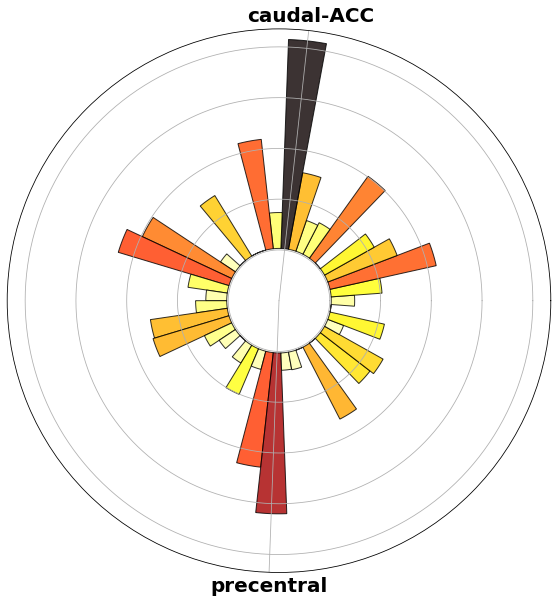

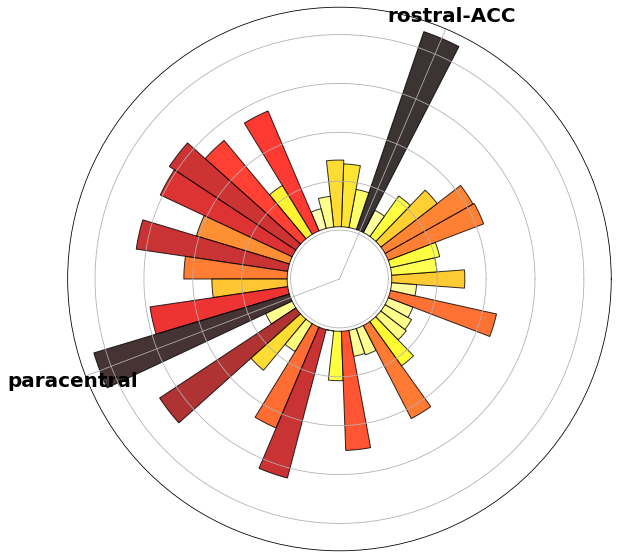

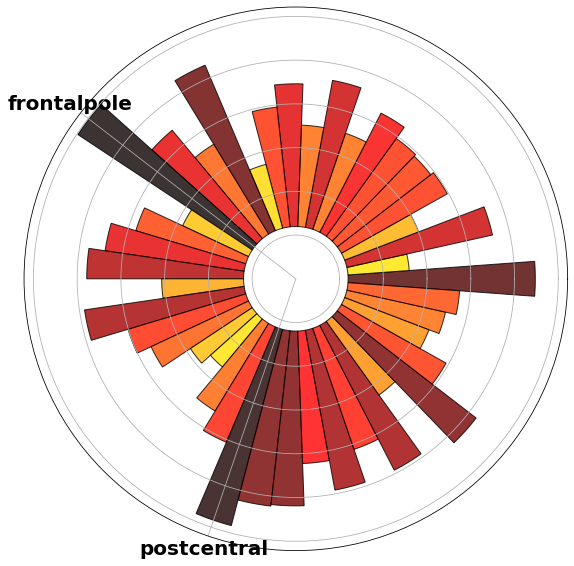

In [108]:
for ii in range(3):
    parcel_weights = np.array([squareform(weights_ovr[ii,:]*unique_links[ii])[:, idxs] \
                      for idxs in parcels_dict.values()])
    s = np.abs(parcel_weights).sum(axis=1).sum(axis=1)

    fig=plt.figure(figsize=(20,10))
    ax = plt.subplot(polar=True)
    bars = ax.bar(theta, s, 
                  width=width, 
                  edgecolor='black', 
                  linewidth=1, bottom=max(s)/4)


    for r, bar in zip(theta, bars):
        bar.set_facecolor(plt.cm.hot_r(bar.get_height()/max(s)))
        bar.set_alpha(0.8)

    ax.set_xticks(theta[np.argsort(s)[::-1][:2]])        
    ax.set_xticklabels(parcels[np.argsort(s)[::-1][:2]], weight='bold', size=20)        
    #ax.set_xticklabels([])
    ax.set_yticklabels([])
    fig.savefig('../plots/strength_clus_%d.png' % (ii +1), dpi=600)
    fig.savefig('../plots/strength_clus_%d.svg' % (ii +1), dpi=600)

In [1747]:
for name, idxs in parcels_dict.items():
    print("name = %s, strength %f" % (name, np.sum(squareform(abs(weights_ovr[0,:]*unique_links[0]))[:, idxs])))

name = Accumbens, strength 0.230373
name = Caudate, strength 0.502534
name = Hippocampus, strength 1.071537
name = Pallidum, strength 0.731234
name = Putamen, strength 0.560608
name = Thalamus-Proper, strength 0.000000
name = VentralDC, strength 0.991826
name = amygdala, strength 0.349082
name = anteriorcingulate, strength 0.319847
name = bankssts, strength 0.766777
name = caudalanteriorcingulate, strength 2.059192
name = caudalmiddlefrontal, strength 0.353423
name = cerebellum, strength 1.083627
name = cuneus, strength 0.000000
name = dorsomedial, strength 0.000000
name = entorhinal, strength 0.698235
name = extrastriate, strength 0.000000
name = frontalpole, strength 0.176028
name = fusiform, strength 0.971687
name = inferiortemporal, strength 1.138229
name = insula, strength 0.391267
name = lateralorbitofrontal, strength 0.206037
name = lingual, strength 0.306483
name = middletemporal, strength 0.765192
name = paracentral, strength 0.780553
name = parahippocampal, strength 0.296257


In [ ]:
from scipy.stats import ttest_ind
for ii in range(3):
    print(ttest_ind(np.sum(XX[:,unique_links[ii]], axis=1)[yy==ii], 
                    np.sum(XX[:,unique_links[ii]], axis=1)[yy!=ii])
         )

In [150]:
from scipy.stats import ttest_ind
for ii in range(3):
    print(ttest_ind(np.sum(XX[:,unique_links[ii]], axis=1)[yy==ii], 
                    np.sum(XX[:,unique_links[ii]], axis=1)[yy!=ii])
         )

Ttest_indResult(statistic=-2.9199668285295255, pvalue=0.003592013547688591)
Ttest_indResult(statistic=16.587059554997218, pvalue=7.901278591133969e-54)
Ttest_indResult(statistic=-13.602435058635141, pvalue=2.5937755811853883e-38)


In [173]:
order_cols = np.concatenate([np.where(unique_links[0])[0], 
                             np.where(unique_links[1])[0], 
                             np.where(unique_links[2])[0]])
order_rows = np.concatenate([np.where(yy==0)[0], np.where(yy==1)[0], np.where(yy==2)[0]])

In [183]:
from matplotlib import colors

In [189]:
colors.DivergingNorm(vmin=vmin, vmax=vmax, vcenter=0)

NameError: name 'vmin' is not defined

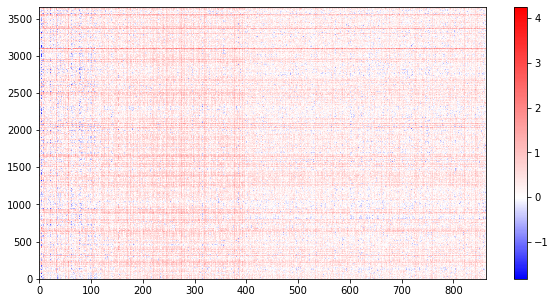

In [219]:
plt.figure(figsize=(10, 5))
vmax=np.max(XX[order_rows,:])
vmin=np.min(XX[order_rows,:])

plt.pcolormesh(XX[order_rows,:].T, 
               cmap=plt.cm.bwr, 
               norm=colors.DivergingNorm(vmin=vmin, vmax=vmax, vcenter=0))
plt.colorbar()

In [128]:
from sklearn.manifold import MDS, TSNE

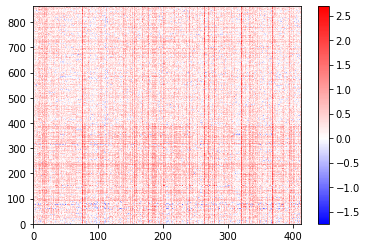

In [381]:
vmax=np.max(XX[order_rows,:][:, unique_links[2]])
vmin=np.min(XX[order_rows,:][:, unique_links[2]])
plt.pcolormesh(XX[order_rows,:][:, unique_links[2]], cmap=plt.cm.bwr,
              norm=colors.DivergingNorm(vmin=vmin, vmax=vmax, vcenter=0))
plt.colorbar()
#plt.vlines(sum(yy==0), ymin=0, ymax=len(order_cols))

#plt.pcolormesh(XX[order_rows,:][:, unique_links[1]].T, cmap=plt.cm.bwr)

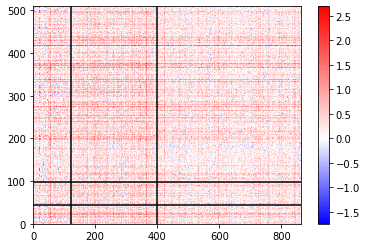

In [362]:
vmax=np.max(XX[order_rows,:][:, order_cols])
vmin=np.min(XX[order_rows,:][:, order_cols])
plt.pcolormesh(XX[order_rows,:][:, order_cols].T, cmap=plt.cm.bwr,  
               norm=colors.DivergingNorm(vmin=vmin, vmax=vmax, vcenter=0))
plt.vlines(sum(yy==0), ymin=0, ymax=len(order_cols))
plt.vlines(sum(yy==0) + sum(yy==1), ymin=0, ymax=len(order_cols))

plt.hlines(sum(unique_links[0]), xmin=0, xmax=XX.shape[0])
#plt.hlines(sum(unique_links[0]), xmin=0, xmax=XX.shape[0])
plt.hlines(sum(unique_links[0]) + sum(unique_links[1]), xmin=0, xmax=XX.shape[0])
plt.colorbar()

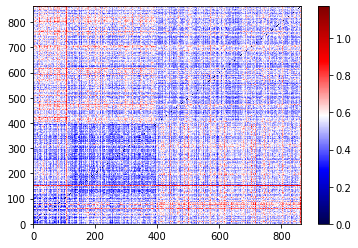

In [345]:
plt.pcolormesh(1-np.corrcoef(XX[order_rows,:][:, order_cols]),
                             cmap=plt.cm.seismic)
plt.colorbar()

In [171]:
D_1 = np.sqrt(2*(1-np.corrcoef(XX)))

D_2 = np.sqrt(2*(1-np.corrcoef(XX[:, order_cols])))  #np.sqrt(2*(1-np.corrcoef(XX[:, order_cols])))

In [126]:
D_2.shape

(863, 863)

In [448]:
tsne=TSNE(metric='precomputed', 
          random_state=40,#30,#RANDOM_STATE,
          perplexity=50, #100, #100., 
          early_exaggeration=10,#20,#20,
          learning_rate=1000)#100)#12)

In [338]:
from sklearn.decomposition import PCA
pca = PCA(n_components=100)

In [313]:
order_cols = np.concatenate([np.where(unique_links[0])[0], 
                             np.where(unique_links[1])[0], 
                             np.where(unique_links[2])[0]])

In [413]:
D_1 = np.sqrt(2*(1-np.corrcoef(XX[:, order_cols])))
D_2 = np.sqrt(2*(1-np.corrcoef(XX[:, np.any(support_mat, axis=0)])))#np.sqrt(2*(1-np.corrcoef(XX[:, order_cols])))

In [449]:
X_tsne_1 = tsne.fit_transform(D_1)
X_tsne_2 = tsne.fit_transform(D_2)

In [450]:
km = KMeans(n_clusters=3)
print(adjusted_rand_score(yy, km.fit_predict(X_tsne_1)))
print(adjusted_rand_score(yy, km.fit_predict(X_tsne_2)))

0.3775518785524053
0.6088682286641166


In [455]:
np.random.randint(0, 1000, size=100)

array([841, 445, 439, 929, 584, 997,  71, 125, 851, 465, 258, 615, 159,
       666, 696, 329, 641, 307, 680, 755, 165, 669, 989, 756, 879, 505,
       774, 885, 842,  63, 341, 818, 957, 367, 140, 137, 426, 641, 512,
       632, 395, 119, 496, 929,  50, 451, 455, 625, 505, 210, 302, 626,
       618, 263, 707, 708, 151, 711,  50,  43, 802, 629, 362,  92, 457,
       147, 956,  28, 560, 489, 624, 369, 413,  51, 653, 992, 434, 134,
       361, 686, 193, 971, 762, 426, 934, 163, 138, 940, 519, 236, 587,
       737, 721, 556, 456, 184, 237, 424, 945, 136])

In [457]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, mutual_info_score

acc = 0
foo = 0
np.random.seed(RANDOM_STATE)
for rand_foo in np.random.randint(0, 1000, size=100):
    tsne=TSNE(metric='precomputed', 
              random_state=rand_foo,#RANDOM_STATE,
              perplexity=50, #100, #100., 
              early_exaggeration=10,#20,#20,
              learning_rate=1000)#100)#12)
    X_tsne_1 = tsne.fit_transform(D_1)
    X_tsne_2 = tsne.fit_transform(D_2)
    
    acc_temp = adjusted_rand_score(yy, km.fit_predict(X_tsne_2))
    
    if acc_temp > acc:
        acc = acc_temp
        foo = rand_foo

    km = KMeans(n_clusters=3)
    print(adjusted_rand_score(yy, km.fit_predict(X_tsne_1)))
    print(adjusted_rand_score(yy, km.fit_predict(X_tsne_2)))
    print(" ")

0.3674622414653028
0.5978615813602365
 
0.3317611511017981
0.5642265507184689
 
0.37479682275329784
0.5648447853486719
 
0.3821774350837954
0.5874233494684895
 
0.37551771651224164
0.5191677059059823
 
0.4727476583466301
0.4892777151274454
 
0.449938485347947
0.5590851640276382
 
0.37396569262890367
0.5739112586861057
 
0.397063599958834
0.5439776022567052
 
0.38002234473689595
0.4712953399737325
 
0.5182119068746248
0.5443445787333249
 
0.36618327260931427
0.5682755173036901
 
0.37600476307177066
0.5169344332253062
 
0.377533657344537
0.5213083780310739
 
0.45323390285623805
0.5530845176667777
 
0.4630991192929589
0.5630249378551606
 
0.3805337971348153
0.5681800500606808
 
0.37953895496728096
0.5506028333182588
 
0.5106340160002011
0.5784541204172667
 
0.4835531097772104
0.5188451780247987
 
0.36196908276716105
0.4927805262503119
 
0.37253387382750514
0.5950516146526643
 
0.5853723008866365
0.5410982090851735
 
0.5025187264115012
0.577800815369571
 
0.41090589965881646
0.568180050060

In [469]:
tsne=TSNE(metric='precomputed', 
              random_state=foo,#RANDOM_STATE,
              perplexity=50, #100, #100., 
              early_exaggeration=10,#20,#20,
              learning_rate=1000)#100)#12)
X_tsne_1 = tsne.fit_transform(D_1)
X_tsne_2 = tsne.fit_transform(D_2)

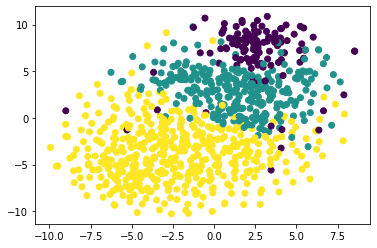

In [470]:
plt.scatter(X_tsne_1[:,0], X_tsne_1[:,1], c=yy)

(-15, 15)

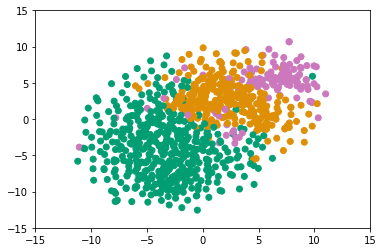

In [476]:
plt.scatter(X_tsne_2[:,0], X_tsne_2[:,1], c=cs)
plt.ylim([-15, 15])
plt.xlim([-15,15])

In [23]:
current_palette=sns.color_palette('colorblind')
c_1 = current_palette[4]
c_2 = current_palette[1]
c_3 = current_palette[2]

cs = []
for val in yy:
    if val == 0:
        cs.append(c_1)
    elif val == 1:
        cs.append(c_2)
    else:
        cs.append(c_3)
        

NameError: name 'yy' is not defined

In [475]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, mutual_info_score, adjusted_mutual_info_score
km = KMeans(n_clusters=3)
print(adjusted_mutual_info_score(yy, km.fit_predict(X_tsne_1)))
print(adjusted_mutual_info_score(yy, km.fit_predict(X_tsne_2)))

0.4258135395084641
0.5707320342514889


In [482]:
print('x max =', np.sort(X_tsne_2[:,0])[::-1][1], 'x min =', np.sort(X_tsne_2[:,0])[1])
print('y max =', np.sort(X_tsne_2[:,1])[::-1][1], 'y min =', np.sort(X_tsne_2[:,1])[1])

x max = 10.35012 x min = -11.197604
y max = 10.666074 y min = -12.222095


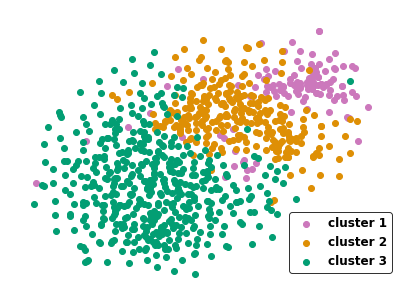

In [485]:
plt.figure(figsize=(7,5))
plt.scatter(X_tsne_2[yy==0][:,0], X_tsne_2[yy==0][:,1], c=[list(current_palette[4])], label='cluster 1')
plt.scatter(X_tsne_2[yy==1][:,0], X_tsne_2[yy==1][:,1], c=[list(current_palette[1])], label='cluster 2')
plt.scatter(X_tsne_2[yy==2][:,0], X_tsne_2[yy==2][:,1], c=[list(current_palette[2])], label='cluster 3')
plt.legend(ncol=1, loc=4, edgecolor='black', prop={'weight':'bold', 'size':12})
plt.xticks([])
plt.yticks([])
plt.ylim([-13, 13])
plt.xlim([-13, 13])
plt.axis('off')
plt.savefig('../plots/t_sne_clusters.png', dpi=600)
plt.savefig('../plots/t_sne_clusters.svg', dpi=600)
pass

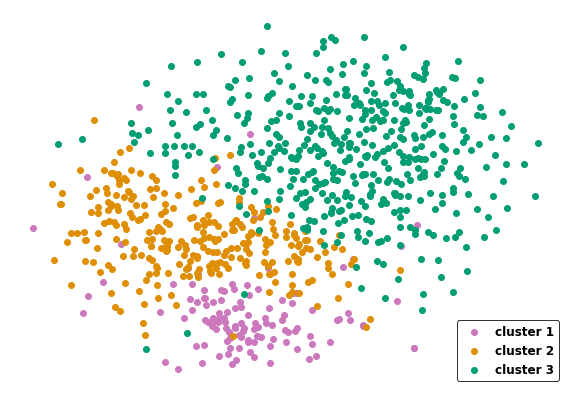

In [447]:
plt.figure(figsize=(10,7))
plt.scatter(X_tsne_2[yy==0][:,0], X_tsne_2[yy==0][:,1], c=[list(current_palette[4])], label='cluster 1')
plt.scatter(X_tsne_2[yy==1][:,0], X_tsne_2[yy==1][:,1], c=[list(current_palette[1])], label='cluster 2')
plt.scatter(X_tsne_2[yy==2][:,0], X_tsne_2[yy==2][:,1], c=[list(current_palette[2])], label='cluster 3')
plt.legend(ncol=1, loc=4, edgecolor='black', prop={'weight':'bold', 'size':12})
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.ylim([-15, 15])
plt.xlim([-15,15])
plt.savefig('../plots/t_sne_clusters.png', dpi=300)
plt.savefig('../plots/t_sne_clusters.svg', dpi=300)
pass

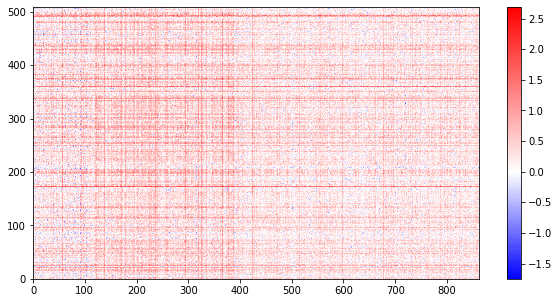

In [218]:
plt.figure(figsize=(10, 5))
vmax=np.max(XX[order_rows,:][:, order_cols])
vmin=np.min(XX[order_rows,:][:, order_cols])

plt.pcolormesh(XX[order_rows,:][:, order_cols].T, 
               cmap=plt.cm.bwr, 
               norm=colors.DivergingNorm(vmin=vmin, vmax=vmax, vcenter=0))
plt.colorbar()

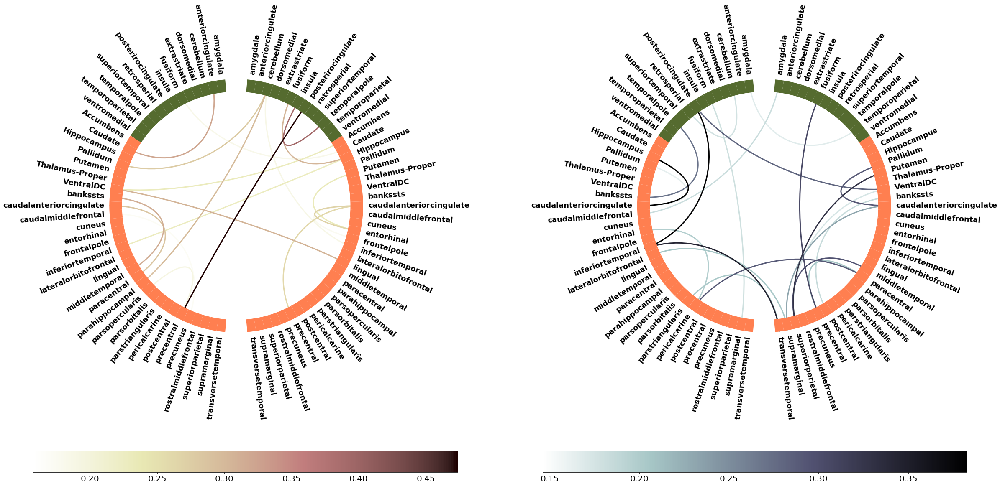

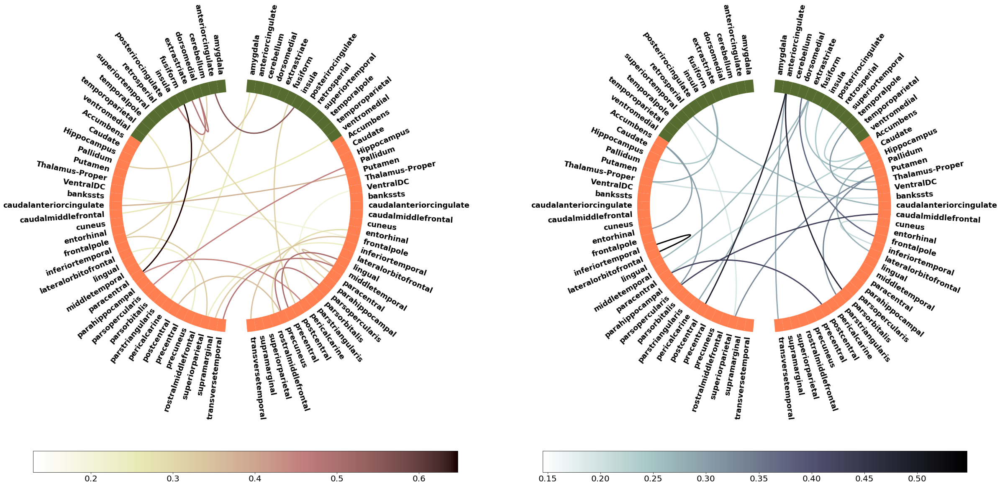

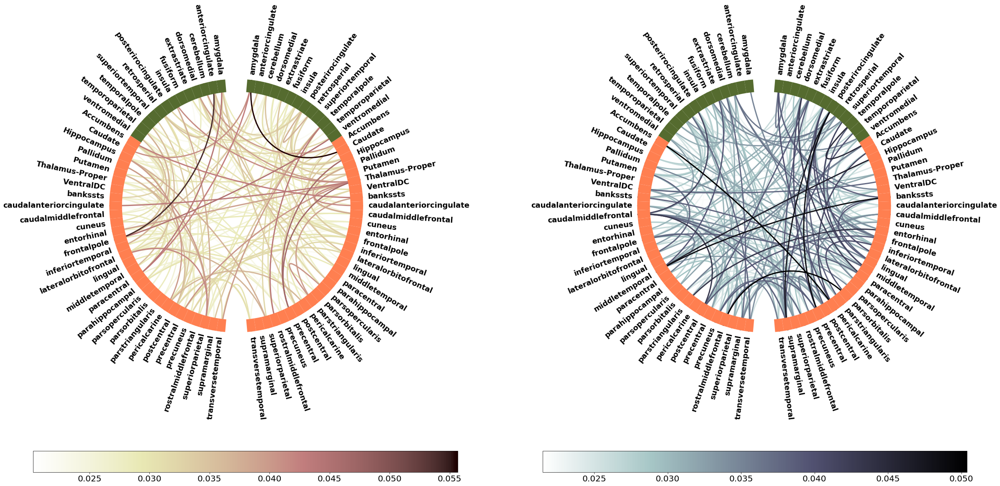

In [1576]:
# Put observed weights into a matrix
for ii in range(3):
    final_model_mat = squareform(weights_ovr[ii]*unique_links[ii]).copy()

    # Separate into positive and negative weights
    A_pos = (final_model_mat>0)
    A_neg = (final_model_mat<0)

    final_model_alpha_pos=abs(final_model_mat)*A_pos
    final_model_alpha_neg=abs(final_model_mat)*A_neg

    final_model_alpha_pos = final_model_alpha_pos[order_idxs,:][:,order_idxs]
    final_model_alpha_neg = final_model_alpha_neg[order_idxs,:][:,order_idxs]

    node_heights  = 1

    fig = plt.figure(figsize=(40,40))

    names_number = name_nodes.copy()

    plot_connectivity_circle(final_model_alpha_pos,
                             node_heights = node_heights,
                             colormap='pink_r', 
                             facecolor='white', textcolor = 'black',
                             node_angles=node_angles, padding=6, fontsize_colorbar=20,
                             fontweight_names = 'semibold',
                             vmin=np.min(final_model_alpha_pos[final_model_alpha_pos>0]),
                             node_names=names_number, node_colors = node_colours,
                             fig=fig, node_linewidth = 0.,colorbar_size=1., 
                             colorbar_pos=(-0.3, 1.8),
                             subplot = 121, fontsize_title=20, fontsize_names=18, 
                                                      linewidth=3, show=False)

    node_heights  = 1.
    names_number = name_nodes.copy()    

    plot_connectivity_circle(final_model_alpha_neg,
                             node_heights = node_heights,
                             colormap='bone_r', facecolor='white', textcolor = 'black',
                             node_angles=node_angles, padding=6, fontsize_colorbar=20,
                             fontweight_names = 'semibold',
                             node_names=names_number, node_colors = node_colours,
                             fig=fig, 
                             vmin=np.min(final_model_alpha_neg[final_model_alpha_neg>0]),
                             node_linewidth = 0.,
                             colorbar_size=1,
                             colorbar_pos=(-0.3, 1.8),
                             subplot = 122,
                             fontsize_title=20, 
                             fontsize_names=18, 
                             linewidth=3,show=False)

    fig.subplots_adjust(left = 0.125,  # the left side of the subplots of the figure
                        right = 0.9,   # the right side of the subplots of the figure
                        bottom = 0.35,  # the bottom of the subplots of the figure
                        top = 0.9,     # the top of the subplots of the figure
                        wspace = 0.3,  # the amount of width reserved for space between subplots,
                        # expressed as a fraction of the average axis width
                        hspace = 0.2 )

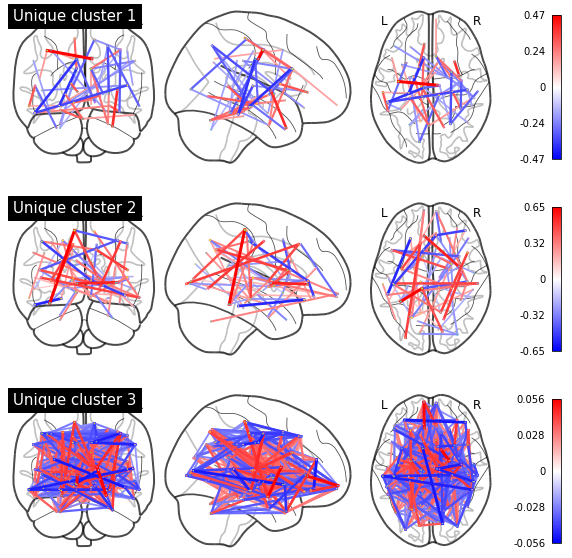

In [1587]:
fig, axs = plt.subplots(nrows=3, figsize=(10,10))
for ii in range(3):
    plotting.plot_connectome(squareform(weights_ovr[ii]*unique_links[ii]), 
                             atlas_coord, #edge_threshold="99.%", 
                             node_size=np.abs(squareform(weights_ovr[ii,:]*unique_links[ii])).sum(axis=0),#10, 
                             axes=axs[ii], 
                             title='Unique cluster %d' %(ii+1), 
                             colorbar=True)

In [ ]:
rfecv = RFECV(pip_rfe, scoring='balanced_accuracy', cv=cv, n_jobs=5)
ovo_rfe_2 = OneVsRestClassifier(rfecv)
ovo_rfe_2.fit(XX, yy)

In [1505]:
np.corrcoef(my_ovo_rfe.estimators_[2].cv_scores_.mean(axis=0), 
            ovo_rfe_2.estimators_[2].grid_scores_)

array([[1., 1.],
       [1., 1.]])

In [1532]:
ovo_rfe_2.estimators_[0].estimator_.named_steps['clf']

LinearSVC(C=1.0, class_weight='balanced', dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=100000.0,
          multi_class='ovr', penalty='l2', random_state=0, tol=0.0001,
          verbose=0)

In [1588]:
pip_rfe

PipelineRFE(memory=None,
            steps=[('ss',
                    StandardScaler(copy=True, with_mean=True, with_std=True)),
                   ('clf',
                    LinearSVC(C=1.0, class_weight='balanced', dual=True,
                              fit_intercept=True, intercept_scaling=1,
                              loss='squared_hinge', max_iter=100000.0,
                              multi_class='ovr', penalty='l2', random_state=0,
                              tol=0.0001, verbose=0))],
            verbose=False)

In [1654]:
pip_c_01 = PipelineRFE([('ss', StandardScaler()), 
                       ('clf', LinearSVC(C=1, 
                                         class_weight='balanced', 
                                         max_iter=1e5, 
                                         random_state=RANDOM_STATE))])
rfe_c01 = RFECV(estimator=pip_c_01, 
                cv=cv, 
                n_jobs=5, 
                step=100, 
                scoring='balanced_accuracy')

ovo_rfe_c01 = OneVsRestClassifier(rfe_c01)
ovo_rfe_c01.fit(XX, yy)

OneVsRestClassifier(estimator=RFECV(cv=StratifiedKFold(n_splits=5, random_state=0, shuffle=True),
                                    estimator=PipelineRFE(memory=None,
                                                          steps=[('ss',
                                                                  StandardScaler(copy=True,
                                                                                 with_mean=True,
                                                                                 with_std=True)),
                                                                 ('clf',
                                                                  LinearSVC(C=1,
                                                                            class_weight='balanced',
                                                                            dual=True,
                                                                            fit_intercept=True,
                                  

In [1668]:
for C in [0.01, 0.1, 1, 10, 100]:
    pip_c_01 = PipelineRFE([('ss', StandardScaler()), 
                           ('clf', LinearSVC(C=C, 
                                             class_weight='balanced', 
                                             max_iter=1e5, 
                                             random_state=RANDOM_STATE))])
    rfe_c01 = RFECV(estimator=pip_c_01, 
                    cv=cv, 
                    n_jobs=5, 
                    step=100, 
                    scoring='balanced_accuracy')

    ovo_rfe_c01 = OneVsRestClassifier(rfe_c01)
    ovo_rfe_c01.fit(XX, yy)
    
    print("C = %f" % C)
    print("cluster_1 = %.3f (%d), "
          "cluster_2 = %.3f (%d), "
          "cluster_3 = %.3f (%d)" % (np.max(ovo_rfe_c01.estimators_[0].grid_scores_),
                                     ovo_rfe_c01.estimators_[0].n_features_,
                                     np.max(ovo_rfe_c01.estimators_[1].grid_scores_),
                                     ovo_rfe_c01.estimators_[1].n_features_,
                                     np.max(ovo_rfe_c01.estimators_[2].grid_scores_),
                                     ovo_rfe_c01.estimators_[2].n_features_))

C = 0.010000
cluster_1 = 0.888 (355),cluster_2 = 0.869 (155),cluster_3 = 0.935 (2555)
C = 0.100000
cluster_1 = 0.884 (155),cluster_2 = 0.859 (1755),cluster_3 = 0.935 (2555)
C = 1.000000
cluster_1 = 0.871 (755),cluster_2 = 0.866 (1555),cluster_3 = 0.934 (2055)
C = 10.000000
cluster_1 = 0.880 (255),cluster_2 = 0.861 (1455),cluster_3 = 0.936 (2055)
C = 100.000000
cluster_1 = 0.875 (855),cluster_2 = 0.861 (1355),cluster_3 = 0.936 (2055)


Let's create a new atlas with both hemispheres merged

In [454]:
# first map

labels_dict = {}

for ii, name in enumerate(labels):
    labels_dict[name] = ii

In [493]:
atlas_sn_data = atlas_sn.get_fdata().copy()
atlas_merged_data = np.zeros_like(atlas_sn_data)

In [494]:
labels_merged_map = {}
for ii, (name, sn_idx) in enumerate(parcels_dict_2.items()):
    for idx in sn_idx:
        atlas_merged_data[atlas_sn_data==(idx + 1)] = ii + 1
        labels_merged_map[name] = ii + 1

In [495]:
atlas_merged = image.new_img_like(atlas_sn, data=atlas_merged_data)

In [497]:
#labels_merged_map

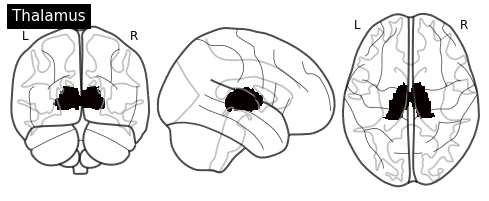

In [498]:
plotting.plot_glass_brain(image.math_img('img1*(img1==%d).astype(int)' % 6, 
                                             img1=atlas_merged), title='Thalamus')

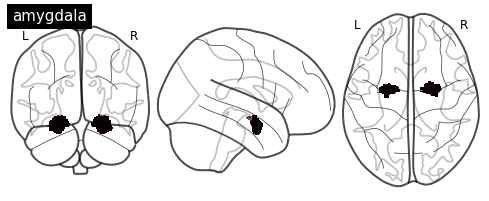

In [499]:
plotting.plot_glass_brain(image.math_img('img1*(img1==%d).astype(int)' % 8, 
                                             img1=atlas_merged), title='amygdala')

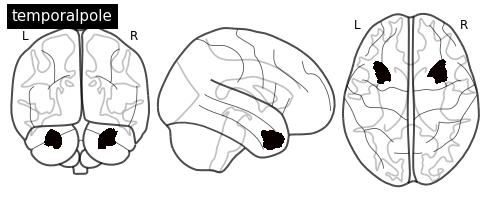

In [504]:
plotting.plot_glass_brain(image.math_img('img1*(img1==%d).astype(int)' % 38, 
                                             img1=atlas_merged), title='temporalpole')

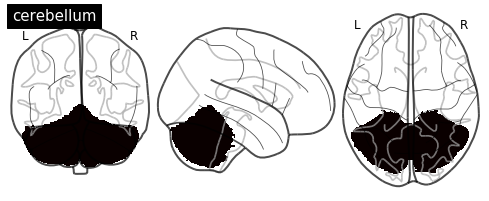

In [505]:
plotting.plot_glass_brain(image.math_img('img1*(img1==%d).astype(int)' % 11, 
                                             img1=atlas_merged), title='cerebellum')

In [506]:
#labels_merged_map

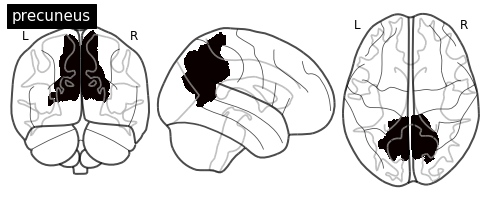

In [503]:
plotting.plot_glass_brain(image.math_img('img1*(img1==%d).astype(int)' % 32, 
                                             img1=atlas_merged), title='precuneus')

In [481]:
for name, idx in labels_merged_map.items():
    plt.figure()
    plotting.plot_glass_brain(image.math_img('img1*(img1==%d).astype(int)' % idx, 
                                             img1=atlas_merged), title=name)

/home/javier/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/home/javier/anaconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:602: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  facecolor=facecolor)


KeyboardInterrupt: 

<Figure size 432x288 with 0 Axes>

Error in callback <function flush_figures at 0x7f9e2b08cb00> (for post_execute):


KeyboardInterrupt: 

{'Accumbens': 1,
 'Caudate': 2,
 'Hippocampus': 3,
 'Pallidum': 4,
 'Putamen': 5,
 'Thalamus-Proper': 6,
 'VentralDC': 7,
 'amygdala': 8,
 'bankssts': 9,
 'caudalmiddlefrontal': 10,
 'cerebellum': 11,
 'cuneus': 12,
 'dorsomedial': 13,
 'entorhinal': 14,
 'extrastriate': 15,
 'frontalpole': 16,
 'fusiform': 17,
 'inferiortemporal': 18,
 'insula': 19,
 'lateralorbitofrontal': 20,
 'lingual': 21,
 'middletemporal': 22,
 'paracentral': 23,
 'parahippocampal': 24,
 'parsopercularis': 25,
 'parsorbitalis': 26,
 'parstriangularis': 27,
 'pericalcarine': 28,
 'postcentral': 29,
 'posterirocingulate': 30,
 'precentral': 31,
 'precuneus': 32,
 'retrosperial': 33,
 'rostralmiddlefrontal': 34,
 'superiorparietal': 35,
 'superiortemporal': 36,
 'supramarginal': 37,
 'temporalpole': 38,
 'temporoparietal': 39,
 'transversetemporal': 40,
 'ventromedial': 41,
 'rostral-ACC': 42,
 'caudal-ACC': 43}

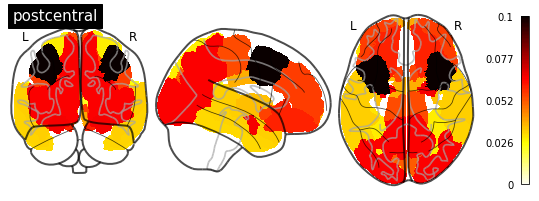

In [725]:
plotting.plot_glass_brain(temp_img, title = map_of_who, colorbar=True)

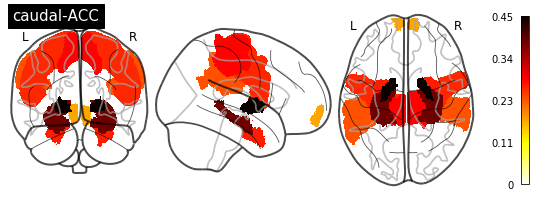

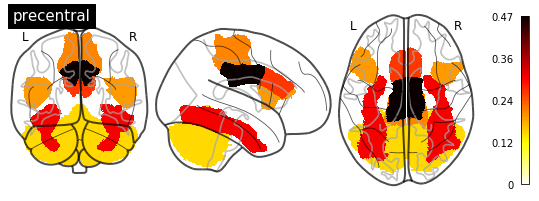

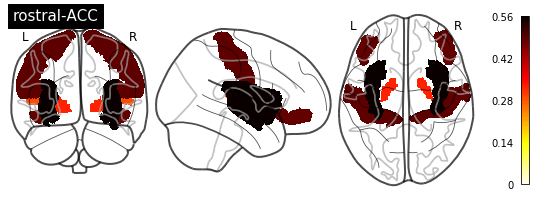

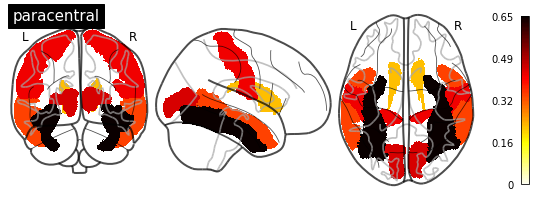

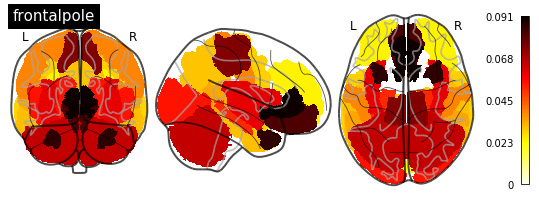

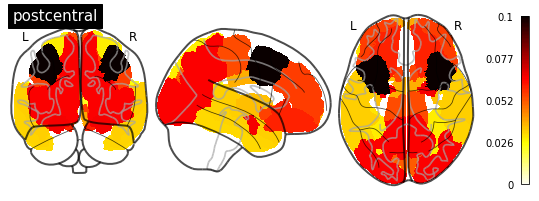

In [726]:
for clus_id in ['clus_1', 'clus_2', 'clus_3']:
    strength_ord_idxs = np.argsort(np.sum(weights_parcels_dict[clus_id], 1))[::-1]
    for idx in strength_ord_idxs[:2]:
        w_temp = weights_parcels_dict[clus_id].iloc[idx,:]

        temp = np.zeros_like(atlas_merged_data)

        for label in w_temp.index[w_temp>0]:
            label_id = labels_merged_map[label]
            temp[atlas_merged_data==label_id] = w_temp.loc[label]
        temp_img = image.new_img_like(atlas_merged, temp)
        
        map_of_who = weights_parcels_dict[clus_id].index[idx]
        plotting.plot_glass_brain(temp_img, 
                                  title = map_of_who, colorbar=True)
        #plt.savefig('../plots/panel_f_%s_conn_map_%s.png' % (clus_id, map_of_who))
        #plt.savefig('../plots/panel_f_%s_conn_map_%s.svg' % (clus_id, map_of_who))

In [514]:
print(weights_parcels_dict['clus_1'].loc['caudal-ACC',:].sort_values(ascending=False).head())
print(weights_parcels_dict['clus_1'].loc['precentral',:].sort_values(ascending=False).head())

Pallidum       0.453618
Hippocampus    0.382820
paracentral    0.285292
entorhinal     0.268043
precentral     0.261326
Name: caudal-ACC, dtype: float64
posterirocingulate    0.473711
fusiform              0.305629
caudal-ACC            0.261326
paracentral           0.205584
parsopercularis       0.191929
Name: precentral, dtype: float64


In [518]:
weights_parcels_dict['clus_2'].loc['paracentral',:]

Accumbens               0.000000
Caudate                 0.227451
Hippocampus             0.000000
Pallidum                0.000000
Putamen                 0.000000
Thalamus-Proper         0.000000
VentralDC               0.000000
amygdala                0.000000
rostral-ACC             0.000000
bankssts                0.000000
caudal-ACC              0.000000
caudalmiddlefrontal     0.000000
cerebellum              0.000000
cuneus                  0.000000
dorsomedial             0.000000
entorhinal              0.000000
extrastriate            0.000000
frontalpole             0.000000
fusiform                0.647223
inferiortemporal        0.000000
insula                  0.000000
lateralorbitofrontal    0.000000
lingual                 0.000000
middletemporal          0.347275
paracentral             0.000000
parahippocampal         0.000000
parsopercularis         0.000000
parsorbitalis           0.000000
parstriangularis        0.000000
pericalcarine           0.446458
postcentra

In [516]:
print(weights_parcels_dict['clus_2'].loc['rostral-ACC',:].sort_values(ascending=False).head())
print(weights_parcels_dict['clus_2'].loc['paracentral',:].sort_values(ascending=False).head())

insula                0.556902
postcentral           0.485990
parsorbitalis         0.482598
Pallidum              0.325017
transversetemporal    0.287852
Name: rostral-ACC, dtype: float64
fusiform          0.647223
pericalcarine     0.446458
postcentral       0.420169
middletemporal    0.347275
Caudate           0.227451
Name: paracentral, dtype: float64


In [506]:
print(weights_parcels_dict['clus_3'].loc['frontalpole',:].sort_values(ascending=False).head())
print(weights_parcels_dict['clus_3'].loc['postcentral',:].sort_values(ascending=False).head())

Accumbens       0.090636
rostral-ACC     0.089234
temporalpole    0.085325
ventromedial    0.080934
paracentral     0.073975
Name: frontalpole, dtype: float64
caudalmiddlefrontal     0.103222
amygdala                0.066591
precuneus               0.065962
extrastriate            0.065629
lateralorbitofrontal    0.060457
Name: postcentral, dtype: float64


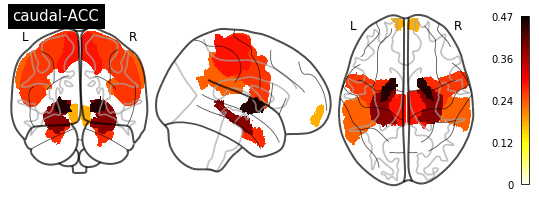

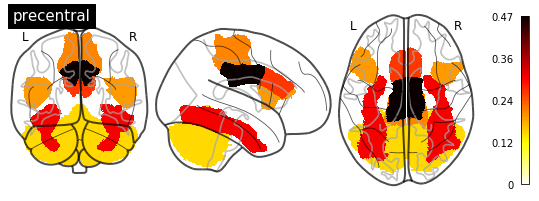

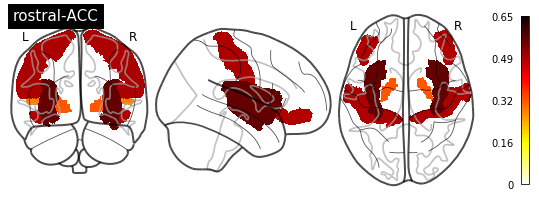

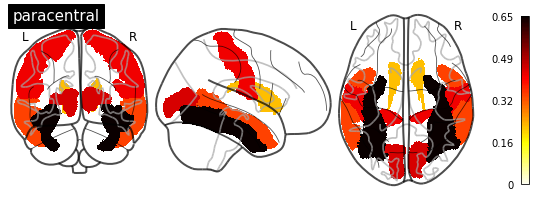

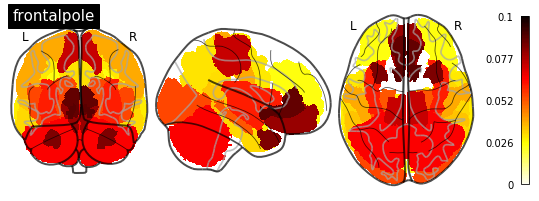

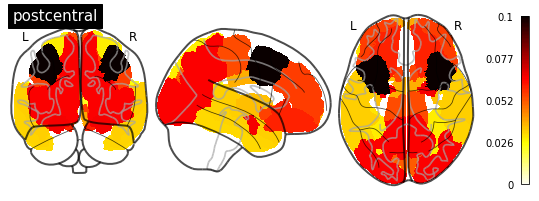

In [776]:
for clus_id in ['clus_1', 'clus_2', 'clus_3']:
    strength_ord_idxs = np.argsort(np.sum(weights_parcels_dict[clus_id], 1))[::-1]
    #df only with this two maximum 
    temp_df = weights_parcels_dict[clus_id].iloc[strength_ord_idxs[:2],:]
    vmax = np.max(np.max(temp_df))
    vmin = np.min(np.min(temp_df[temp_df>0]))
    for ii in range(2):
        w_temp = temp_df.iloc[ii, :]

        temp = np.zeros_like(atlas_merged_data)

        for label in w_temp.index[w_temp>0]:
            label_id = labels_merged_map[label]
            temp[atlas_merged_data==label_id] = w_temp.loc[label]
        temp_img = image.new_img_like(atlas_merged, temp)
        
        map_of_who = temp_df.index[ii]
        plotting.plot_glass_brain(temp_img, title = map_of_who, vmin=vmin, vmax=vmax, colorbar=True)
        plt.savefig('../plots/panel_f_%s_conn_map_%s.png' % (clus_id, map_of_who))
        plt.savefig('../plots/panel_f_%s_conn_map_%s.svg' % (clus_id, map_of_who))

In [519]:
labels_merged_map.keys()

NameError: name 'labels_merged_map' is not defined

In [774]:
print(list(labels_merged_map.keys()))

['Accumbens', 'Caudate', 'Hippocampus', 'Pallidum', 'Putamen', 'Thalamus-Proper', 'VentralDC', 'amygdala', 'bankssts', 'caudalmiddlefrontal', 'cerebellum', 'cuneus', 'dorsomedial', 'entorhinal', 'extrastriate', 'frontalpole', 'fusiform', 'inferiortemporal', 'insula', 'lateralorbitofrontal', 'lingual', 'middletemporal', 'paracentral', 'parahippocampal', 'parsopercularis', 'parsorbitalis', 'parstriangularis', 'pericalcarine', 'postcentral', 'posterirocingulate', 'precentral', 'precuneus', 'retrosperial', 'rostralmiddlefrontal', 'superiorparietal', 'superiortemporal', 'supramarginal', 'temporalpole', 'temporoparietal', 'transversetemporal', 'ventromedial', 'rostral-ACC', 'caudal-ACC']


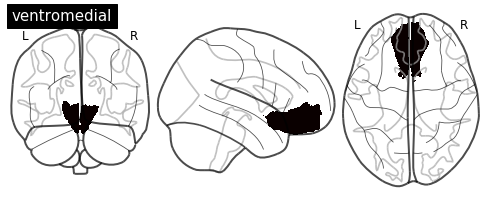

In [769]:
plotting.plot_glass_brain(image.math_img('img1*(img1==%d).astype(int)' % 41, 
                                             img1=atlas_merged), title='ventromedial')

In [765]:
temp_df.iloc[0,:].index[temp_df.iloc[0,:].argsort()[::-1]]

Index(['Accumbens', 'rostral-ACC', 'temporalpole', 'ventromedial',
       'paracentral', 'cerebellum', 'insula', 'extrastriate', 'Hippocampus',
       'postcentral', 'bankssts', 'inferiortemporal', 'retrosperial',
       'precuneus', 'parahippocampal', 'precentral', 'middletemporal',
       'rostralmiddlefrontal', 'lingual', 'cuneus', 'Pallidum', 'amygdala',
       'Thalamus-Proper', 'temporoparietal', 'Putamen', 'caudal-ACC',
       'Caudate', 'caudalmiddlefrontal', 'VentralDC', 'supramarginal',
       'dorsomedial', 'entorhinal', 'frontalpole', 'fusiform',
       'superiortemporal', 'transversetemporal', 'parsopercularis',
       'parsorbitalis', 'parstriangularis', 'pericalcarine',
       'posterirocingulate', 'superiorparietal', 'lateralorbitofrontal'],
      dtype='object')

In [525]:
plotting.plot_glass_brain?

In [540]:
np.asarray(current_palette[2])*255

array([  2., 158., 115.])